#### Inputs
- A triangular mesh
- A 2D image with a set of categorical attributes defined in each pixel, e.g a class label
- The respective camera parameters, for a pinhole camera


#### Task
Transfer the categorical attributes from the image to the triangles of the mesh.


#### Assumptions
We assume that each triangle is atomic w.r.t the distribution of the attributes on the surface.
I.e, if we sample an infinite number of points on the triangle and project them into the image (taking occlusions into account), then all the points get the same category.
In the real world, this is not precisely true, since (1) the triangulation of the mesh may be arbitrarily nonsemantic, (2) the resolution of the 2D image (and the segmentation) may be too low, and (3) the accuracy of the 2D segmentation may be low.
The first two issues can be easily mitigated by (1) standard mesh subdivision and retopology techniques, and (2) image upsampling.


#### Algorithm
1. Represent each triangle with a set of 3D points uniformly distributed on the surface of the triangle.
   If the triangles are sufficiently small, we can just use a single barycenter of the triangle.
2. Test the visibility of the samples from the viewpoint of the image.
   If the fraction of the visible samples for a triangle is less than a threshold, then we conclude that the triangle is not reliably visible from the image and do not transfer the attributes to this triangle.
   Otherwise, we keep the triangle, and represent it with only the visible samples.
3. Project the samples to the image and transfer the attributes from the image to the samples.
4. Aggregate the attributes.

In this example, we check the visiblity using raycasting on CPU.
See [cast_categorical_img_gl](cast_categorical_img_gl.ipynb) for the version that uses GPU-accelerated rasterization instead of raycasting.

In [1]:
import sys

import numpy as np
import open3d as o3d
import matplotlib.pyplot as plt
import scipy.spatial
import torch

sys.path.append('../../../src')
from ovl.rendering.mesh_rendering import MeshRenderer
from ovl.camera.camera_model import PinholeCameraModel

dtype = torch.float

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


## Data

Here, we use the data from Skoltech3D dataset.

In [2]:
scene, view_i = 'dragon', 55
cam, modality, var, light = 'tis_right', 'rgb', 'undistorted', 'ambient@best'

data_dir = '/mnt/datasets/sk3d/dataset'

## Define the 2D segmentation

In this example, we set the segmentation manually.
We show it together with a photo of the scene for illustration.

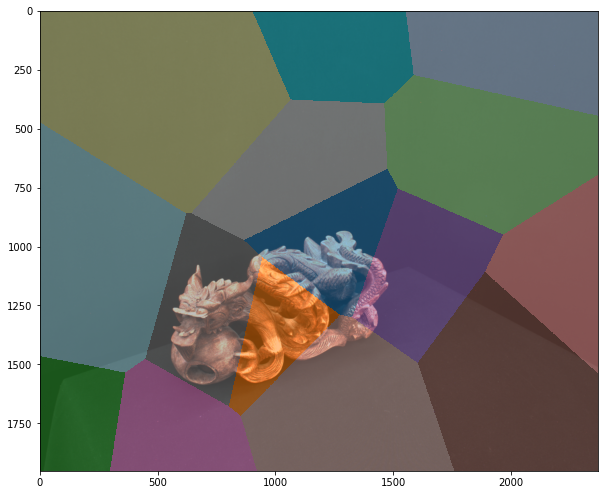

In [3]:
from utils import segment_randomly

rgb = f'{data_dir}/{scene}/{cam}/{modality}/{var}/{light}/{view_i:04}.png'
rgb = plt.imread(rgb)
h, w = rgb.shape[:2]

seg = segment_randomly(h, w, 15)

plt.figure(figsize=(10, 10))
plt.imshow(rgb)
plt.imshow(seg, cmap='tab20', interpolation='none', alpha=.5)

## Resample the triangles

In [4]:
mesh = f'{data_dir}/{scene}/stl/reconstruction/cleaned.ply'
mesh = o3d.io.read_triangle_mesh(mesh)

If the triangles are sufficiently small, we can represent each triangle with just its barycenter.

In [5]:
verts = np.asarray(mesh.vertices)
verts = torch.from_numpy(verts).to(dtype)
tris = np.asarray(mesh.triangles)
tris = torch.from_numpy(tris).to(torch.long)
tri_verts = verts[tris.view(-1)].view(*tris.shape, 3); del tris, verts
centers = tri_verts.mean(dim=1); del tri_verts
samples = centers; del centers
sample_tri_ids = torch.arange(len(samples), dtype=torch.long)

In [6]:
# Check the results in Meshlab
# save the mesh
o3d.io.write_triangle_mesh('/tmp/mesh.ply', mesh)

# save the samples
pc = o3d.geometry.PointCloud()
pc.points = o3d.utility.Vector3dVector(samples.double().contiguous().numpy())
# samples with different color represent different triangles (but we only have 10 different colors)
colors = plt.cm.tab10(sample_tri_ids.remainder(10).numpy())[:, :3]
pc.colors = o3d.utility.Vector3dVector(colors)
o3d.io.write_point_cloud('/tmp/samples.ply', pc)

True

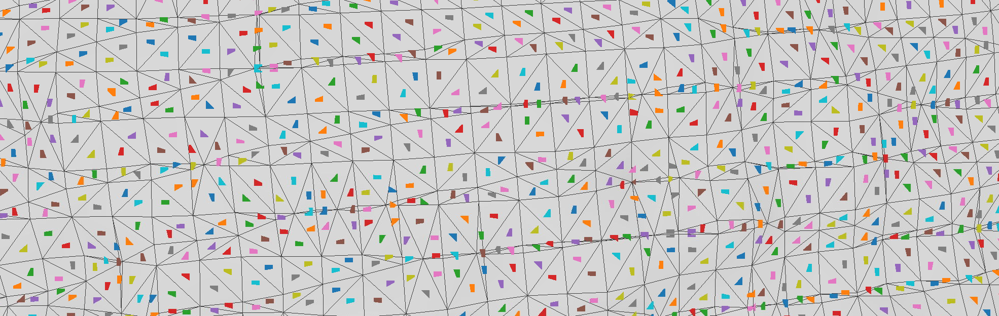

__Otherwise,__ we can resample the triangles uniformly.

Here is an example of a simple fast quasi-uniform sampling for meshes with a relatively small number of large triangles.

In [ ]:
from tqdm.auto import tqdm

from utils import sample_on_grid

# downsample the hi-res mesh from the dataset to make the triangles large
mesh_w_large_tris = mesh.simplify_vertex_clustering(1e-2)
mesh = mesh_w_large_tris

# resample the triangles
sampling_step = 2e-3
verts = np.asarray(mesh.vertices)
verts = torch.from_numpy(verts).to(torch.float)
tris = np.asarray(mesh.triangles)
tris = torch.from_numpy(tris).to(torch.long)
samples, sample_tri_ids = sample_on_grid(verts, tris, sampling_step, grid_type='tri', progress_fn=tqdm); del verts, tris
samples = samples.to(dtype)

In [ ]:
# Check the results in Meshlab
# save the mesh
o3d.io.write_triangle_mesh('/tmp/mesh.ply', mesh)

# save the samples
pc = o3d.geometry.PointCloud()
pc.points = o3d.utility.Vector3dVector(samples.double().contiguous().numpy())
# samples with different color represent different triangles (but we only have 10 different colors)
colors = plt.cm.tab10(sample_tri_ids.remainder(10).numpy())[:, :3]
pc.colors = o3d.utility.Vector3dVector(colors)
o3d.io.write_point_cloud('/tmp/samples.ply', pc)

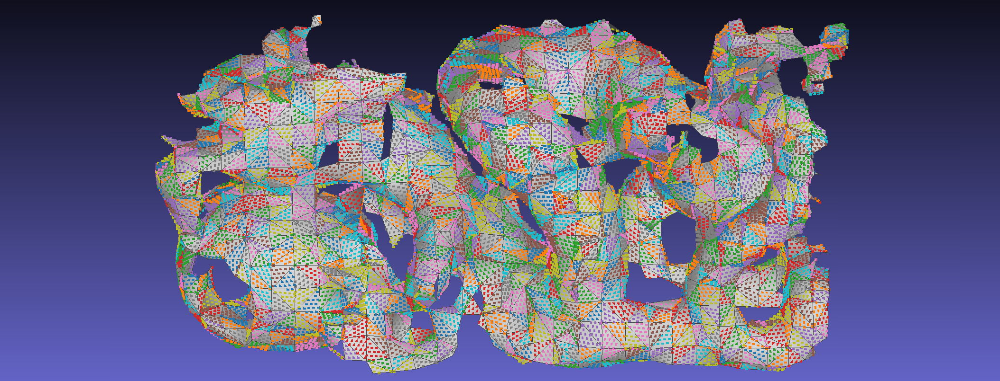

## Test visibility of samples

For this, we cast a ray from the camera towards each sample.
If the ray hits the same triangle that the sample was sampled from then the sample is visible from the camera.

We also need to check that
- the triangle is facing towards the camera,
- the sample gets projected inside the image canvas,
- the sample is not behind the camera.

In [7]:
# Load the camera model
cam_model = f'{data_dir}/calibration/{cam}/{modality}/cameras.txt'
cam_model = np.loadtxt(cam_model, usecols=range(2, 8))
cam_model = PinholeCameraModel(cam_model[2:4], cam_model[4:6], cam_model[:2].astype(int))

# Load the camera pose
pose = f'/{data_dir}/{scene}/{cam}/{modality}/images.txt'
pose = np.loadtxt(pose, usecols=range(1, 8))[view_i]
w2c = np.eye(4)
w2c[:3, 3] = pose[4:7]
w2c_xyzw = [*pose[1:4], pose[0]]; del pose
w2c[:3, :3] = scipy.spatial.transform.Rotation.from_quat(w2c_xyzw).as_matrix(); del w2c_xyzw
w2c = torch.from_numpy(w2c).to(dtype)
c2w = w2c.inverse()

In [8]:
# Init raycasting context
renderer = MeshRenderer(mesh)

# Make rays
rays = torch.empty([len(samples), 6], dtype=torch.float)
cam_center = c2w[:3, 3]
rays[:, :3] = cam_center
rays[:, 3:] = torch.nn.functional.normalize(samples - cam_center, dim=1); del cam_center

# Cast rays
# cull_backface=True allows to reject the triangles facing away from the camera
render = renderer.render_rays(rays, cull_backface=True); del rays, renderer
tri_is_same = sample_tri_ids == render.tri_ids; del render

In [9]:
# Transform the samples into the camera space
samples_c = samples @ w2c[:3, :3].T + w2c[:3, 3]

# Check depth
min_depth = .3
is_infront = samples_c[:, 2] >= min_depth

# Check that samples are inside the canvas
uv = cam_model.project(samples_c.T); del samples_c
is_inside = cam_model.uv_is_in_bounds(uv); del uv

sample_is_visible = tri_is_same & is_infront & is_inside; del tri_is_same, is_infront, is_inside

In [10]:
# Check the results in Meshlab
from utils import vis_cam_pose


pc = o3d.geometry.PointCloud()
pc.points = o3d.utility.Vector3dVector(samples.double().contiguous().numpy())

# visible samples are white
colors = sample_is_visible.double().unsqueeze(1).expand(-1, 3)
pc.colors = o3d.utility.Vector3dVector(colors.double().numpy())
o3d.io.write_point_cloud('/tmp/samples.ply', pc)

# also show the camera position
cam_vis = vis_cam_pose(c2w.unsqueeze(0))
o3d.io.write_triangle_mesh('/tmp/cams.ply', cam_vis)

True

The result for the original, non-downsampled mesh.

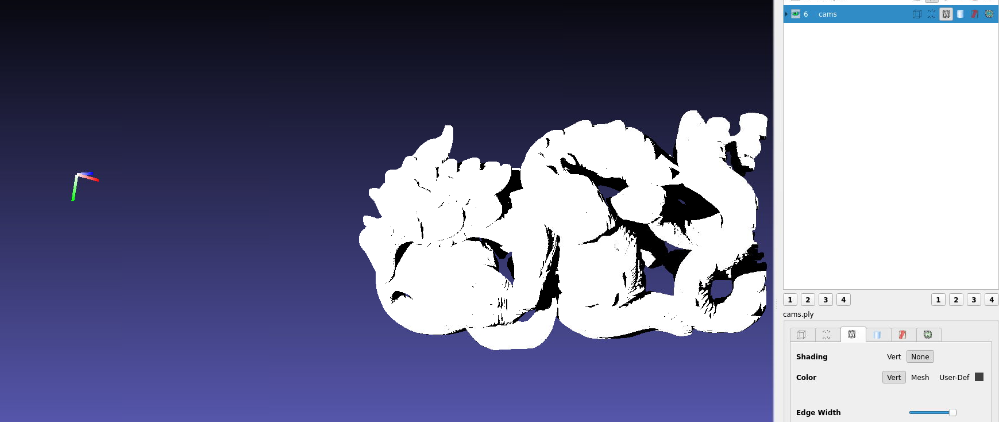

## Test visibility of triangles

If the fraction of the visible samples for a triangle is less than a threshold, then we conclude that the triangle is not reliably visible from the image and do not transfer the attributes to this triangle.

In [11]:
# Count the total number of samples per triangle
tris_n = len(mesh.triangles)
samples_n = torch.zeros(tris_n)
samples_n = samples_n.scatter_(0, sample_tri_ids, torch.ones_like(sample_tri_ids, dtype=samples_n.dtype), reduce='add').int()
assert samples_n.sum() == len(sample_tri_ids)

# Count the number of visible samples per triangle
vis_sample_tri_ids = sample_tri_ids[sample_is_visible]
vis_samples_n = torch.zeros(tris_n)
vis_samples_n = vis_samples_n.scatter_(0, vis_sample_tri_ids, torch.ones_like(vis_sample_tri_ids, dtype=vis_samples_n.dtype), reduce='add').int()
assert vis_samples_n.sum() == len(vis_sample_tri_ids)
del vis_sample_tri_ids

vis_samples = vis_samples_n / samples_n; del vis_samples_n, samples_n

min_vis_samples = .5
tri_is_visible = vis_samples >= min_vis_samples; del vis_samples

In [12]:
# Check the results in Meshlab
hid_tri_ids = tri_is_visible.logical_not().nonzero().squeeze(1)
only_vis_tris = o3d.geometry.TriangleMesh(mesh)
only_vis_tris.remove_triangles_by_index(hid_tri_ids.int().numpy()); del hid_tri_ids
o3d.io.write_triangle_mesh('/tmp/vis_tris.ply', only_vis_tris)

True

The result for the downsampled mesh.
Triangles with a sufficient number of visible samples are green.

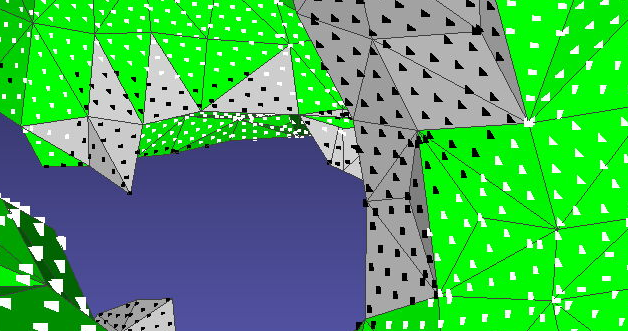

## Transfer attributes from the image to samples

In [13]:
# Transform the samples into the camera space
samples_c = samples @ w2c[:3, :3].T + w2c[:3, 3]

# Project samples to the image
uv = cam_model.project(samples_c.T); del samples_c
uv = cam_model.uv_to_torch(uv.T)

uv = uv.unsqueeze(0)  # 1, samples_n, 2
attr_img = seg.unsqueeze(0)  # attrs_n == 1, h, w
sample_attrs = torch.nn.functional.grid_sample(
    attr_img.unsqueeze(0).to(uv), uv.unsqueeze(0), mode='nearest', align_corners=False
).squeeze(2).squeeze(0).to(attr_img)  # attrs_n, samples_n
del uv, attr_img

True

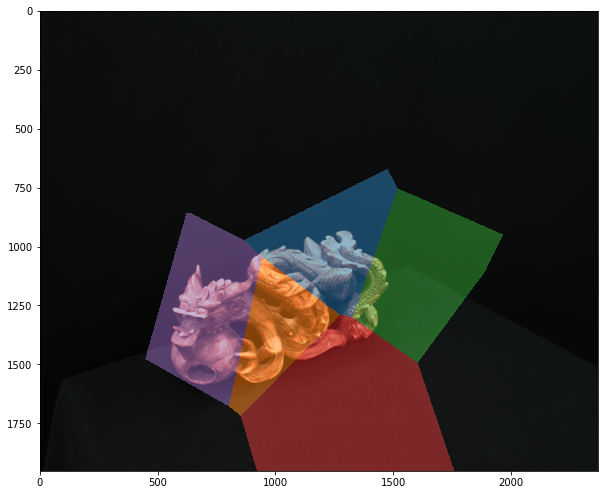

In [14]:
# Check the results in Meshlab
# sync colormaps for the image and the samples
casted_classes = sample_attrs.squeeze(0).unique()

colors = plt.cm.tab10.colors
colors = torch.tensor(colors)
colors = colors[:len(casted_classes)]

cmap = torch.zeros(seg.max() + 1, 3)
cmap[casted_classes] = colors; del casted_classes, colors

seg_vis = cmap[seg.view(-1)].view(*seg.shape, 3)

plt.figure(figsize=(10, 10))
plt.imshow(rgb)
plt.imshow(seg_vis, interpolation='none', alpha=.5)

pc = o3d.geometry.PointCloud()
pc.points = o3d.utility.Vector3dVector(samples.double().contiguous().numpy())

colors = cmap[sample_attrs.squeeze(0)]
colors[~sample_is_visible] = 0
pc.colors = o3d.utility.Vector3dVector(colors.double().numpy())
o3d.io.write_point_cloud('/tmp/samples.ply', pc)

For the original hi-res mesh, the samples look like this:

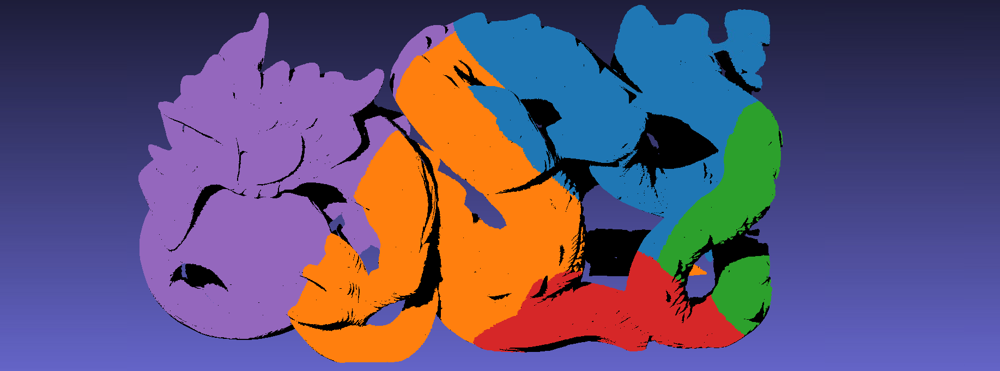

For the downsampled mesh, the samples look like this:
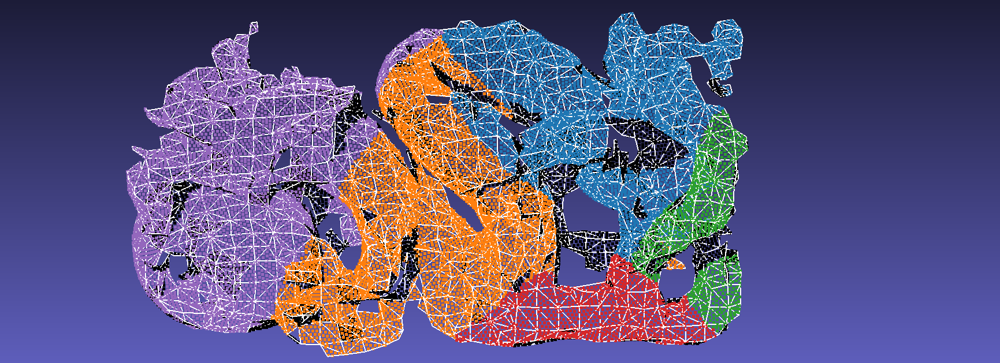

## Aggregate the attributes per triangle

Recall that we assume the triangles to be atomic, so that all the samples for each triangle receive the same set of attribute values.
In practice, this may not be precisely true, so for each triangle we pick the attribute value that is supported by the majority of samples.

Here we do it for a single attribute.
Multiple attributes, e.g, semantic and instance segmentation, can be transfered sequentially.

In [15]:
attr_i = 0
sample_cls = sample_attrs[attr_i][sample_is_visible]
vis_sample_tri_ids = sample_tri_ids[sample_is_visible]

tris_n = len(mesh.triangles)
no_class_val = -1
tri_class = torch.full([tris_n], no_class_val, dtype=sample_cls.dtype)
tri_class_sup = torch.zeros_like(tri_class, dtype=torch.int)

for class_val in sample_cls.unique():
    is_this_cls = sample_cls == class_val
    this_cls_tri_ids = vis_sample_tri_ids[is_this_cls]; del is_this_cls
    
    samples_n = torch.zeros(tris_n)
    samples_n = samples_n.scatter_(0, this_cls_tri_ids, torch.ones_like(this_cls_tri_ids, dtype=samples_n.dtype), reduce='add').int()
    assert samples_n.sum() == len(this_cls_tri_ids)
    del this_cls_tri_ids
    
    is_major = samples_n > tri_class_sup
    tri_class_sup[is_major] = samples_n[is_major]; del samples_n
    tri_class[is_major] = class_val; del is_major
del sample_cls, vis_sample_tri_ids, tri_class_sup

# Reject the non-visible triangles
tri_class[~tri_is_visible] = no_class_val

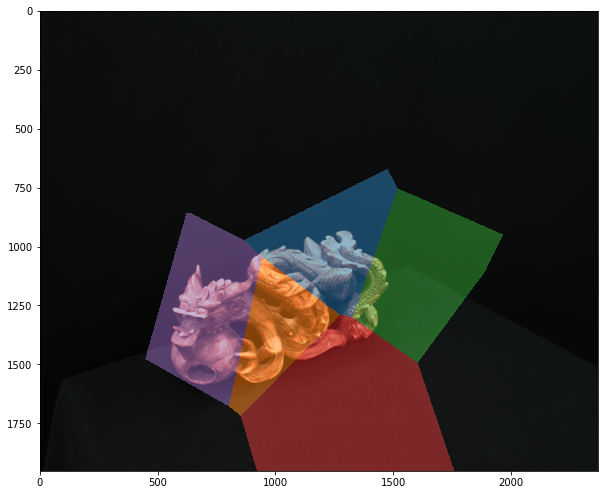

In [16]:
# Check the results in Meshlab
# Open3D can't set colors per face, so here we use Trimesh
import trimesh


plt.figure(figsize=(10, 10))
plt.imshow(rgb)
plt.imshow(seg_vis, interpolation='none', alpha=.5)

colors = cmap[tri_class]
colors[~tri_is_visible] = 0
mesh_seg = trimesh.Trimesh(
    vertices=np.asarray(mesh.vertices),
    faces=np.asarray(mesh.triangles),
    face_colors=colors.numpy(),
)
trimesh.exchange.export.export_mesh(mesh_seg, '/tmp/mesh_seg.ply');

For the original hi-res mesh, the mesh looks like this:
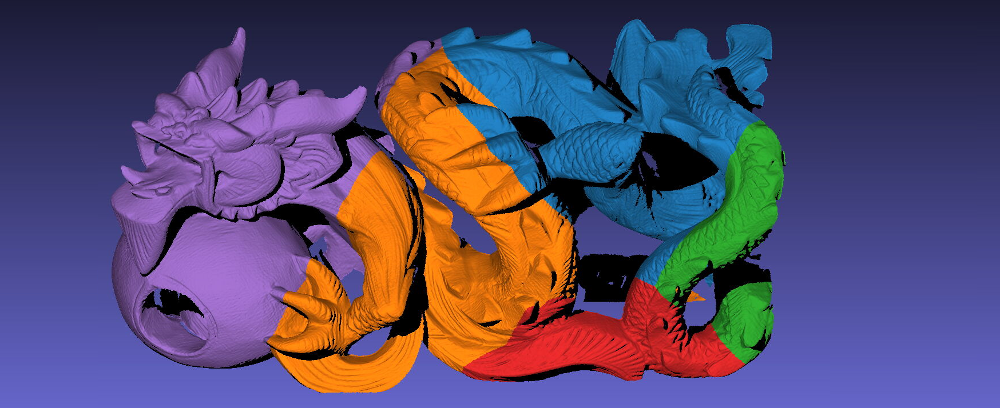

For the downsampled mesh, the segmented mesh looks like this:
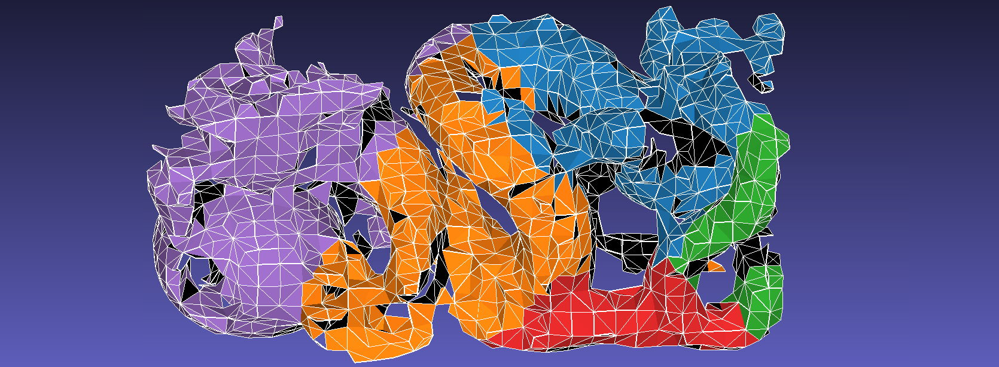

This code can be further accelerated if we reject the occluded triangles and samples as soon as possible, and perform the further computations only for the visible elements.